In [1]:
import torch
from torch import nn
import torch.nn.functional as F
import torchvision
from torch.utils.data import Dataset, DataLoader
import math
import torchvision
import torchvision.transforms.v2 as transforms
import torchvision.transforms.functional as TF
import random

# importing user defined modules
import numpy as np
import cv2
from PIL import Image
import os
import sys
import matplotlib.pyplot as plt
from collections import namedtuple
from torchvision import models

# device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# importing all user defined modules
from transfer import transfer_model
from dataset import SRdatasets
from model import FSRCNN
from utils import PSNR, predict, display_random, display_particular, convert_rgb_to_y, convert_rgb_to_ycbcr, convert_ycbcr_to_rgb, combine_y_with_cbcr
from vgg import Vgg16, PerceptualLoss



# Initialize VGG-16 feature extractor (requires_grad=False for fixed weights)
vgg_model = Vgg16(requires_grad=False).to(device)

# Initialize Perceptual Loss
perceptual_loss_fn = PerceptualLoss(vgg_model).to(device)

# instantiate dataset object
dataset = SRdatasets(dataset_path = 'C:/Users/athar/MLprojects/dataloader_task/Datasets')

print("dataset class, vgg model, and perceptual loss function initialised successfully")

C:\Users\athar\anaconda3\envs\gpu_env\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\athar\anaconda3\envs\gpu_env\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


dataset class, vgg model, and perceptual loss function initialised successfully


checkpoint loaded successfully


transfer previous model? 1/0:  1


model transfered successfully


transfer the previous train, val, and test sets? (1/0):  1


couldn't load partitioned datasets. gotta partition them freshly


start traning?(1) OR skip to inference?(0):  1


starting training
Epoch [1/30], Step [4/64], Loss: 8300.2441, PSNR: 11.1246, diff(pred - input): -13.7416 
Epoch [1/30], Step [8/64], Loss: 5913.6768, PSNR: 11.8163, diff(pred - input): -12.5612 
Epoch [1/30], Step [12/64], Loss: 5355.8306, PSNR: 12.1563, diff(pred - input): -13.9045 
Epoch [1/30], Step [16/64], Loss: 3756.9851, PSNR: 14.2015, diff(pred - input): -11.1799 
Epoch [1/30], Step [20/64], Loss: 3334.3337, PSNR: 14.8346, diff(pred - input): -10.2350 
Epoch [1/30], Step [24/64], Loss: 3625.9185, PSNR: 14.5331, diff(pred - input): -11.3574 
Epoch [1/30], Step [28/64], Loss: 2655.6997, PSNR: 17.5536, diff(pred - input): -8.5913 
Epoch [1/30], Step [32/64], Loss: 2558.8477, PSNR: 17.4649, diff(pred - input): -8.3960 
Epoch [1/30], Step [36/64], Loss: 2787.9463, PSNR: 17.2362, diff(pred - input): -7.2844 
Epoch [1/30], Step [40/64], Loss: 3048.5356, PSNR: 16.8979, diff(pred - input): -7.0256 
Epoch [1/30], Step [44/64], Loss: 2987.0852, PSNR: 16.4947, diff(pred - input): -6.4406 

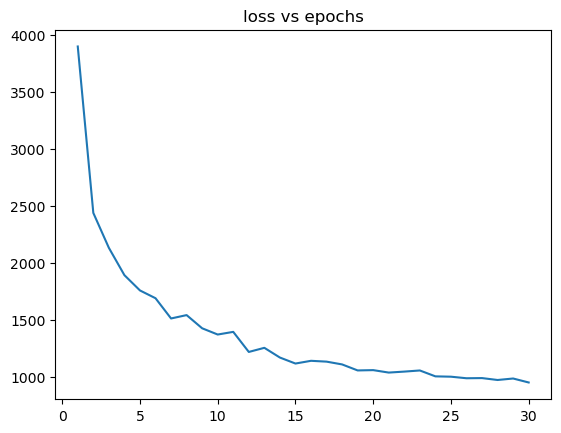

epoch_loss_list:  [3897.7873458862305, 2438.4353618621826, 2132.10147857666, 1892.5091590881348, 1758.5224800109863, 1690.3097343444824, 1512.7114162445068, 1542.3541774749756, 1426.638126373291, 1371.9323825836182, 1395.2244215011597, 1219.1754426956177, 1255.3615036010742, 1170.1165676116943, 1117.5446043014526, 1141.4890451431274, 1134.2279109954834, 1109.8384523391724, 1057.08678150177, 1059.7762928009033, 1038.328067779541, 1046.8781003952026, 1056.7481546401978, 1005.1893348693848, 1002.2140226364136, 988.5508632659912, 989.9951162338257, 973.2847719192505, 986.2892637252808, 951.4876718521118]


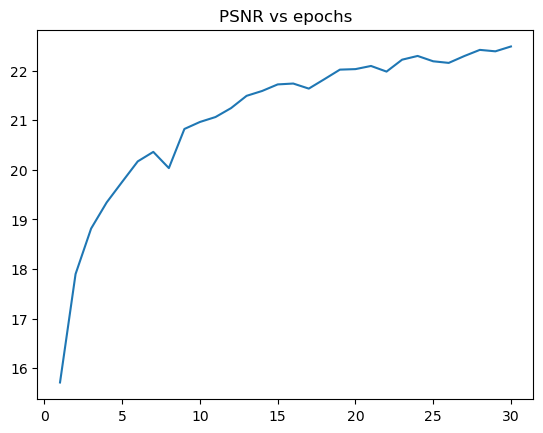

Some examples: 


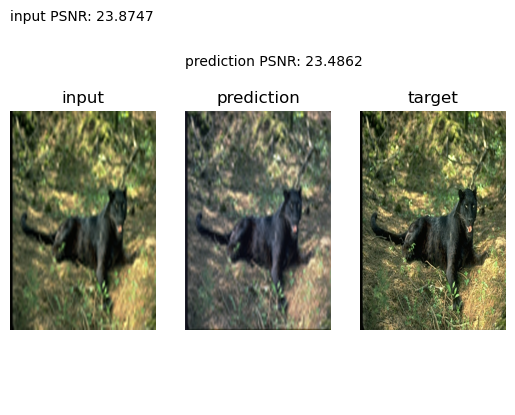

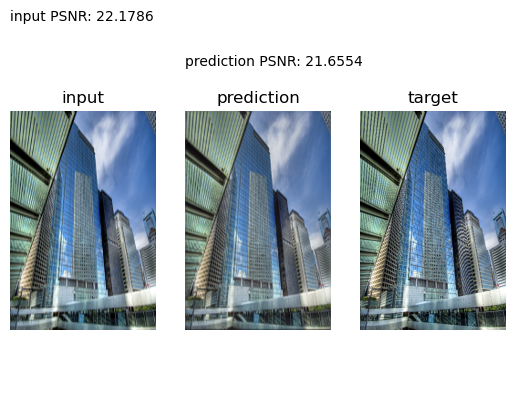

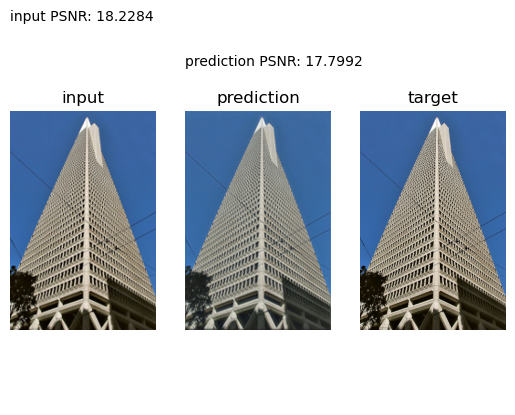

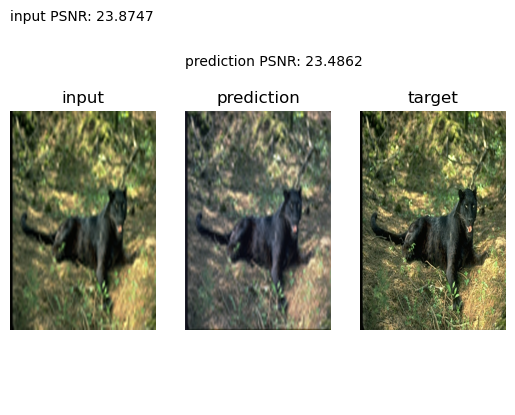

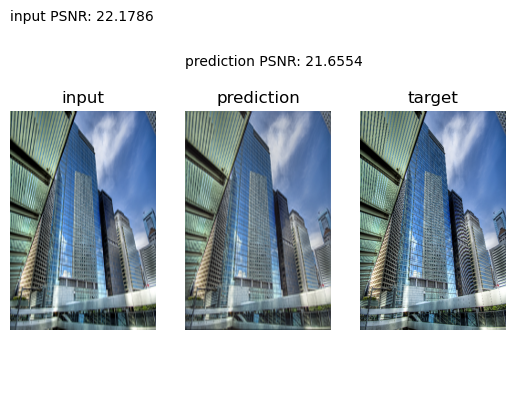

...

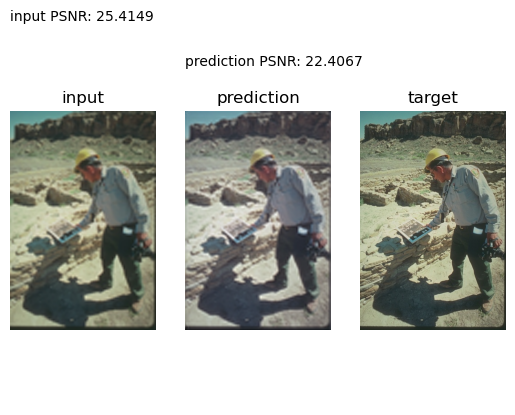

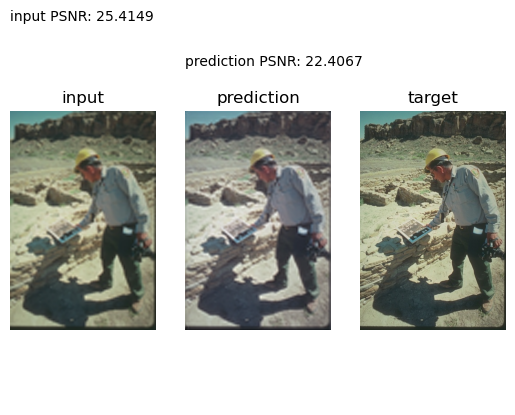

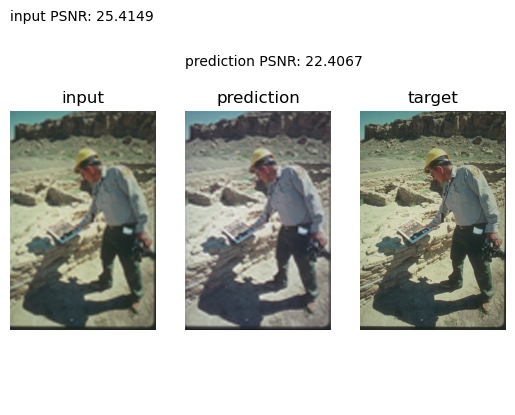

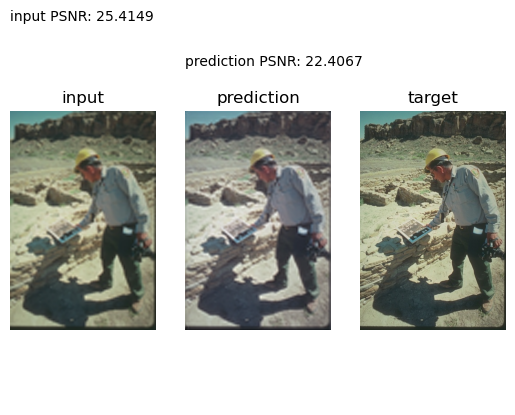

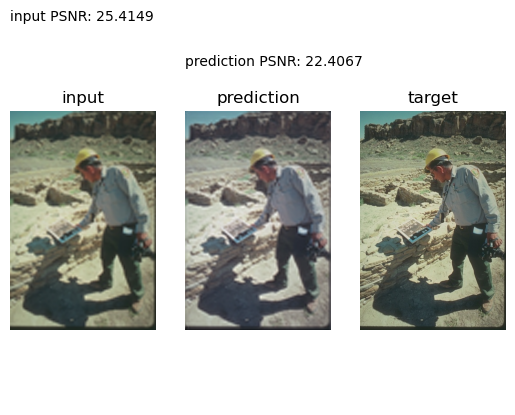

model saved as 'buffer.pt'


In [11]:

# initialising hyperparameters
train_size = 512*2 # 512*2 = 1024, *2 becuase of deterministic transform (horizontal flip)
test_size = 17*4
num_epochs = 30
learning_rate = 0.35e-3
batch_size = 16

# initialising model and optimizer
model = FSRCNN().to(device)
pixel_loss = nn.MSELoss()
dummy_optimizer  = torch.optim.SGD(
    [
        {'params': model.first_part.parameters()},
        {'params': model.mid_part.parameters()},
        {'params': model.last_part.parameters(), 'lr': learning_rate * 0.1}
    ],
    lr=learning_rate,  # Global learning rate, lr = learning_rate)
) # dummy optimizer to load previous SGD without error and without modifying the transfer.py file
# this dummy optimizer can be used while switching between different optimizers (Adam/SGD) while transfering previous model

optimizer = torch.optim.Adam(
    [
        {'params': model.first_part.parameters()},
        {'params': model.mid_part.parameters()},
        {'params': model.last_part.parameters(), 'lr': learning_rate * 0.1}
    ],
    lr=learning_rate,  # Global learning rate
) # "low learning rate for last layer gives promising results" ~authors of SRCNN paper

# variables for quality metrics - loss and accuracy (PSNR)
batch_loss_agg = 0 # batch loss aggregator (aggregates the loss accross given batch)
batch_acc_agg = 0
epoch_loss = 0
epoch_loss_list = []
epoch_acc_list = []

# stores epochs done for the loaded model
prev_epochs = 0

# transfering (loading) the previous model
PATH = 'buffer.pt'
train_set, test_set, prev_epochs = transfer_model(PATH, dataset, model, optimizer, epoch_loss_list, epoch_acc_list, train_size, test_size, prev_epochs)

# initialising train and test loaders
train_loader = torch.utils.data.DataLoader(train_set, batch_size = batch_size, shuffle = True)
test_loader = torch.utils.data.DataLoader(test_set, batch_size = batch_size, shuffle = True)

num_of_batches = len(train_loader)
epoch = 0

# training
start_training = int(input("start traning?(1) OR skip to inference?(0): "))

if start_training:
    print("starting training")
    gradient_accumulation_steps = 3 # effectivec batch size = 16*gradient_accumulation_steps
    # loop invariant: after k'th iteration, k epochs are over and value of epoch is k-1 
    # remember that in this implementation increment is done after condition check
    # more precisely, increment is not done, rather is range() sequence is iterated 
    for epoch in range(num_epochs):
        for i, (inputs, targets) in enumerate(train_loader):
            
            inputs = inputs.to(device)
            targets = targets.to(device)
            
            inputs = convert_rgb_to_y(inputs, 'chw').to(device)
            targets = convert_rgb_to_y(targets, 'chw').to(device)
            
            outputs = model(inputs) # this returns y_pred (ie, only y channel)
            
            outputs = outputs.to(device)

            three_chann_outputs = torch.cat([outputs, outputs, outputs], dim = 1)
            three_chann_targets = torch.cat([targets, targets, targets], dim = 1)
            perceptual_loss = perceptual_loss_fn(three_chann_outputs, three_chann_targets)
            loss = pixel_loss(outputs, targets) + 0.04* perceptual_loss
    
            loss.backward() # computes and accumulates gradients
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=2.0)

            # gradient accumulation leads to better generalisation than just taking larger batch_size
            # see https://ai.stackexchange.com/questions/21972/what-is-the-relationship-between-gradient-accumulation-and-batch-size
            # and https://wandb.ai/ayush-thakur/dl-question-bank/reports/What-s-the-Optimal-Batch-Size-to-Train-a-Neural-Network---VmlldzoyMDkyNDU
            if( (i+1) % gradient_accumulation_steps == 0 ):
                optimizer.step() # updates parameters after 'gradient_accumulation_steps' no. of batches (16*grad_acc_steps images) are analysed
                optimizer.zero_grad() # resets gradients to 0
                
            # this aggregates the loss accross all batches and saves their average
            batch_loss_agg = batch_loss_agg + loss.item()/num_of_batches
    
            step_train_accuracy = PSNR().batch(outputs, targets)
            psnr_input = PSNR().batch(inputs, targets)
       
            batch_acc_agg = batch_acc_agg + step_train_accuracy/num_of_batches
    
            
            if (i + 1) % 4 == 0:
                print(f'Epoch [{epoch + 1}/{num_epochs}], Step [{i + 1}/{len(train_loader)}], Loss: {loss.item():.4f}, PSNR: {step_train_accuracy:.4f}, diff(pred - input): {(step_train_accuracy - psnr_input):.4f} ')
    
            # for freeing up gpu space
            # del inputs, targets, outputs, loss
            # torch.cuda.empty_cache()
            
        epoch_acc_list.append(batch_acc_agg)
        epoch_loss_list.append(batch_loss_agg)
        print(f'batch_loss_agg = {batch_loss_agg} appended, epoch_loss_list = {epoch_loss_list}')
        
        batch_loss_agg = 0
        batch_acc_agg = 0

print('Training finished')
epoch = epoch + 1

# plotting quality metrics
print(f'epoch_loss_list after loop: {epoch_loss_list}')
plt.plot(range(1, prev_epochs + start_training*epoch+1), epoch_loss_list)
plt.title('loss vs epochs')
plt.show()
print('epoch_loss_list: ', epoch_loss_list)
plt.plot(range(1, prev_epochs + start_training*epoch+1), epoch_acc_list)
plt.title('PSNR vs epochs')

plt.show()


# displaying some randomly picked examples
display_random(test_loader, model, batch_size)

'''
# for observing a particular sample (particular image)
see_part = int(input('want to see particular image?(1/0): '))
if see_part:
    i = int(input("Enter the number of example to display: "))
    display_particular(i, model)
'''

# saving buffer model 
PATH = "buffer.pt"
torch.save({
            'epoch_loss_list': epoch_loss_list,
            'epoch_acc_list': epoch_acc_list,
            'epoch': prev_epochs + start_training*epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            # 'train_set': train_set,
            # 'test_set': test_set,
            }, PATH)

print(f"model saved as '{PATH}'")
# stores at: C:\Users\athar\AppData\Roaming\Python\Python312\site-packages
  

In [13]:
# saving final model (if results are satisfactory)
PATH = "fsrcnn_y_sep.pt"
torch.save({
            'epoch_loss_list': epoch_loss_list,
            'epoch_acc_list': epoch_acc_list,
            'epoch': prev_epochs + num_epochs,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            # 'train_set': train_set,
            # 'test_set': test_set,
            }, PATH)

print(f"model saved as '{PATH}'")
# stores at: C:\Users\athar\AppData\Roaming\Python\Python312\site-packages

model saved as 'fsrcnn_y_sep.pt'


input:


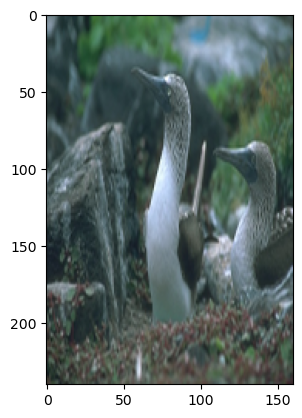

torch.Size([3, 240, 160])
torch.Size([3, 240, 160])
Var(input_rgb[0,...]/input_tensor[0,...]) (red channel variance):0.0000
Var(input_rgb[1,...]/input_tensor[1,...]) (green channel variance):0.0000
Var(input_rgb[2,...]/input_tensor[2,...]) (blue channel variance):0.0000
avg diff:  tensor([-0.3583, -0.3583, -0.3588], device='cuda:0')


In [8]:
# this part of the notebook highlights the challanges encountered while constructing the 
# conversion function from one representation to another before debugging 


# this shows that both ycbcr -> rgb and inverse function is working properly
# the problem lies with either of rgb to y or with combine_y_with_cbcr
'''
Observations so far:
after the combine step:
> the red channel is flawless in the conversion
> the green channel is quite distorted
> and the blue channel is much more distored 

The ratio of red channel values in input image and convert->convert->combine image is almost constant (variance is very low)
While the ratio of other channels has high variance (ratio is not constant accross the pixels)
'''

ycbcr_input = convert_rgb_to_ycbcr(input_tensor)
input_rgb = convert_ycbcr_to_rgb(ycbcr_input)
input_rgb = input_rgb.squeeze(0)
input_arr = input_rgb.cpu().detach().numpy().astype('uint8').transpose(1, 2, 0)
                                                                      
print("input:")
plt.imshow(input_arr)
plt.show()
                                                                       
print(input_tensor.shape)
print(input_rgb.shape)
                                                                       
print(f'Var(input_rgb[0,...]/input_tensor[0,...]) (red channel variance):{(input_rgb[0,...]/input_tensor[0,...]).var():.4f}')
print(f'Var(input_rgb[1,...]/input_tensor[1,...]) (green channel variance):{(input_rgb[1,...]/input_tensor[1,...]).var():.4f}')
print(f'Var(input_rgb[2,...]/input_tensor[2,...]) (blue channel variance):{(input_rgb[2,...]/input_tensor[2,...]).var():.4f}')
                                                                       
print('avg diff: ', (input_rgb-input_tensor).mean(dim = (1, 2)))

input:


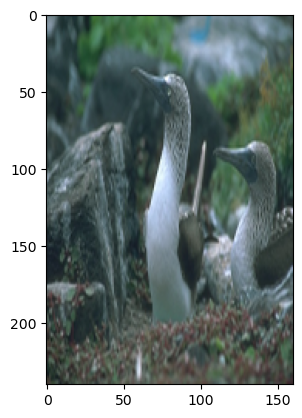

torch.Size([3, 240, 160])
torch.Size([3, 240, 160])
y_input/ycbcr_input[:,0,:,:].unsqueeze(1) = tensor([[[[1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          ...,
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.],
          [1., 1., 1.,  ..., 1., 1., 1.]]]], device='cuda:0')
ycbcr_input[:,1,:,:]/input_ycbcr_combined[:,1,:,:] = tensor([[[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]], device='cuda:0')
Var(input_rgb[0,...]/input_tensor[0,...]) (red channel variance):0.0000
Var(input_rgb[1,...]/input_tensor[1,...]) (green channel variance):0.0000
Var(input_rgb[2,...]/input_tensor[2,...]) (blue channel variance):0.0000
avg diff:  tensor([-0.3583, -0.3583, -0.3588], device='cuda:0')


In [14]:
# shows the variance of the ratio of each channel in the image after rgb->y(convert), y->ycbcr(combine) and ycbcr->rgb with the original image
'''
low variance of ratio of intensity values of a particular channel in 
original input image (input_tensor) and processed image (f^-1(f(input_tensor)) 
signifies that the second image is just increases by a constant factor (higher/lower brightness)
hence the structure of the image is preserved along with the relative colour appearance

while high variance signifies that each value is scalled by a different factor, hence resulting in a noisy final image
that has low structural similarity with the original image
'''
input_tensor, target_tensor = dataset[7]
input_tensor = input_tensor.to(device)

y_input  = convert_rgb_to_y(input_tensor)
ycbcr_input = convert_rgb_to_ycbcr(input_tensor)
input_ycbcr_combined = combine_y_with_cbcr(y_input, ycbcr_input)
input_rgb = convert_ycbcr_to_rgb(input_ycbcr_combined)
input_rgb = input_rgb.squeeze(0)
input_arr = input_rgb.cpu().detach().numpy().astype('uint8').transpose(1, 2, 0)
                                                                      
print("input:")
plt.imshow(input_arr)
plt.show()
                                                                       
print(input_tensor.shape)
print(input_rgb.shape)

# demonstrates that convert_rgb_to_y is consistent with convert_rgb_to_ycbcr => problem lies with combine step only
print(f'y_input/ycbcr_input[:,0,:,:].unsqueeze(1) = {y_input/(ycbcr_input[:,0,:,:].unsqueeze(1))}')

# ratio of original cb channels of original and combined tensors
print(f'ycbcr_input[:,1,:,:]/input_ycbcr_combined[:,1,:,:] = {ycbcr_input[:,1,:,:]/input_ycbcr_combined[:,1,:,:]}')

# prints variance of ratio of values channel-wise
print(f'Var(input_rgb[0,...]/input_tensor[0,...]) (red channel variance):{(input_rgb[0,...]/input_tensor[0,...]).var():.4f}')
print(f'Var(input_rgb[1,...]/input_tensor[1,...]) (green channel variance):{(input_rgb[1,...]/input_tensor[1,...]).var():.4f}')
print(f'Var(input_rgb[2,...]/input_tensor[2,...]) (blue channel variance):{(input_rgb[2,...]/input_tensor[2,...]).var():.4f}')                                                                       
print('avg diff: ', (input_rgb-input_tensor).mean(dim = (1, 2)))